<a href="https://colab.research.google.com/github/mrpintime/Parkinsons-Telemonitoring/blob/main/Parkinsons_Telemonitoring.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Parkinson's Telemonitoring  
**Created by Moein (Mrpintime)**  

# Summary
***Oxford Parkinson's Disease Telemonitoring Dataset***  
Subject of dataset: `Accurate Telemonitoring of Parkinson's Disease Progression by Noninvasive Speech Tests`  

---
**Dataset Description:**  
This dataset is composed of a range of biomedical voice measurements from `42 people with early-stage Parkinson's disease recruited to a six-month trial of a telemonitoring device for remote symptom progression monitoring.` The recordings were automatically captured in the patient's homes.

Columns in the table contain subject number, subject age, subject gender, time interval from baseline recruitment date, motor UPDRS, total UPDRS, and 16 biomedical voice measures. Each row corresponds to one of 5,875 voice recording from these individuals. The main aim of the data is to predict the motor and total UPDRS scores ('motor_UPDRS' and 'total_UPDRS') from the 16 voice measures.

The data is in ASCII CSV format. The rows of the CSV file contain an instance corresponding to one voice recording. There are around 200 recordings per patient, the subject number of the patient is identified in the first column.

Further details are contained [This Site](https://archive.ics.uci.edu/dataset/189/parkinsons+telemonitoring).

---

**Features of Dataset:**  
`subject#` - Integer that uniquely identifies each subject

`age` - Subject age

`sex` - Subject gender '0' - male, '1' - female

`test_time` - Time since recruitment into the trial. The integer part is the number of days since recruitment.

`motor_UPDRS` - Clinician's motor UPDRS score, linearly interpolated

`total_UPDRS` - Clinician's total UPDRS score, linearly interpolated

`Jitter(%)`,`Jitter(Abs)`,`Jitter:RAP`,`Jitter:PPQ5`,`Jitter:DDP` - Several measures of variation in fundamental frequency

`Shimmer`,`Shimmer(dB)`,`Shimmer:APQ3`,`Shimmer:APQ5`,`Shimmer:APQ11`,`Shimmer:DDA` - Several measures of variation in amplitude

`NHR`,`HNR` - Two measures of ratio of noise to tonal components in the voice

`RPDE` - A nonlinear dynamical complexity measure

`DFA` - Signal fractal scaling exponent

`PPE` - A nonlinear measure of fundamental frequency variation  

> If you want to read more about Parkinson's disease use this [Link](https://www.nia.nih.gov/health/parkinsons-disease)

# Objects  
**Problem**: We try to measure Parkinson's Disease Progression by Noninvasive Speech Tests, we use this dataset that has 19 features columns (Except `Subject` which it is `ID(index)` column), we try to use these 19 columns to find relation between features and target features (`motor_UPDRS` and `total_UPDRS`).

---

**Steps:**
1. Setup Notebook
2. Preprocess Dataset
3. Exploratory Data Analysis
4. Unsupervised Analysis
5. Supervised Analysis
6. Results
7. Next Steps

# Setup

In [ ]:
!pip install ucimlrepo

In [1]:
import warnings
def warns (*args, **kwargs):
  pass

warnings.warn = warns

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import scipy
#########################
import tensorflow as tf
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, Lasso, Ridge #L1, L2

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
parkinsons_telemonitoring = fetch_ucirepo(id=189)

# data (as pandas dataframes)
X = parkinsons_telemonitoring.data.features
y = parkinsons_telemonitoring.data.targets


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# save in drive to reuse later
# X.to_csv('drive/MyDrive/Parkinson/X.csv', index=False)
# y.to_csv('drive/MyDrive/Parkinson/y.csv', index=False)

In [ ]:
# read dataset
# X = pd.read_csv('drive/MyDrive/Parkinson/X.csv')
# y = pd.read_csv('drive/MyDrive/Parkinson/y.csv')

# Preprocessing

In [ ]:
# metadata
print(parkinsons_telemonitoring.metadata)

{'uci_id': 189, 'name': 'Parkinsons Telemonitoring', 'repository_url': 'https://archive.ics.uci.edu/dataset/189/parkinsons+telemonitoring', 'data_url': 'https://archive.ics.uci.edu/static/public/189/data.csv', 'abstract': "Oxford Parkinson's Disease Telemonitoring Dataset", 'area': 'Life Science', 'tasks': ['Regression'], 'characteristics': ['Tabular'], 'num_instances': 5875, 'num_features': 19, 'feature_types': ['Integer', 'Real'], 'demographics': ['Age', 'Sex'], 'target_col': ['motor_UPDRS', 'total_UPDRS'], 'index_col': ['subject#'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2009, 'last_updated': 'Thu Sep 07 2023', 'dataset_doi': '10.24432/C5ZS3N', 'creators': ['Athanasios Tsanas', 'Max Little'], 'intro_paper': {'title': "Accurate Telemonitoring of Parkinson's Disease Progression by Noninvasive Speech Tests", 'authors': 'A. Tsanas, Max A. Little, P. McSharry, L. Ramig', 'published_in': 'IEEE Transactions on Biomedical Engineering', 'year':

In [ ]:
# variable information
print(parkinsons_telemonitoring.variables)

             name     role        type demographic  \
0        subject#       ID     Integer        None   
1             age  Feature     Integer         Age   
2       test_time  Feature  Continuous        None   
3       Jitter(%)  Feature  Continuous        None   
4     Jitter(Abs)  Feature  Continuous        None   
5      Jitter:RAP  Feature  Continuous        None   
6     Jitter:PPQ5  Feature  Continuous        None   
7      Jitter:DDP  Feature  Continuous        None   
8         Shimmer  Feature  Continuous        None   
9     Shimmer(dB)  Feature  Continuous        None   
10   Shimmer:APQ3  Feature  Continuous        None   
11   Shimmer:APQ5  Feature  Continuous        None   
12  Shimmer:APQ11  Feature  Continuous        None   
13    Shimmer:DDA  Feature  Continuous        None   
14            NHR  Feature  Continuous        None   
15            HNR  Feature  Continuous        None   
16           RPDE  Feature  Continuous        None   
17            DFA  Feature  

**Some details:**  
The `unified Parkinson's disease rating scale` (`UPDRS`) is used to follow the longitudinal course of Parkinson's disease. The UPD rating scale is the most commonly used scale in the clinical study of Parkinson's disease.

The UPDRS is made up of these sections:

    Part I: evaluation of mentation, behavior, and mood
    Part II: self-evaluation of the activities of daily life (ADLs) including speech, swallowing, handwriting, dressing, hygiene, falling, salivating, turning in bed, walking, and cutting food
    Part III: clinician-scored monitored motor evaluation
    Part IV: complications of therapy
    Part V: Hoehn and Yahr staging of severity of Parkinson's disease
    Part VI: Schwab and England ADL scale

These are evaluated by interview and clinical observation. Some sections require multiple grades assigned to each extremity.

Clinicians and researchers alike use the UPDRS and the motor section in particular to follow the progression of a person's Parkinson's disease. Scientific researchers use it to measure benefits from a given therapy in a more unified and accepted rating system. Neurologists also use it in clinical practice to follow the progression of their patients' symptoms in a more objective manner.

In [ ]:
X.shape, y.shape

((5875, 19), (5875, 2))

In [ ]:
X.head()

,age,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE,sex
0,72,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006,0
1,72,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810,0
2,72,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014,0
3,72,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277,0
4,72,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361,0


In [ ]:
y.head()

,motor_UPDRS,total_UPDRS
0,28.199,34.398
1,28.447,34.894
2,28.695,35.389
3,28.905,35.810
4,29.187,36.375


We should rearrange columns and rename them.

In [ ]:
X.columns

Index(['age', 'test_time', 'Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP',
       'Jitter:PPQ5', 'Jitter:DDP', 'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3',
       'Shimmer:APQ5', 'Shimmer:APQ11', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE',
       'DFA', 'PPE', 'sex'],
      dtype='object')

In [ ]:
X.columns = ['age', 'test_time', 'Jitter_percent', 'Jitter_Abs', 'Jitter_RAP',
       'Jitter_PPQ5', 'Jitter_DDP', 'Shimmer', 'Shimmer_dB', 'Shimmer_APQ3',
       'Shimmer_APQ5', 'Shimmer_APQ11', 'Shimmer_DDA', 'NHR', 'HNR', 'RPDE',
       'DFA', 'PPE', 'sex']
X = X[['age', 'sex', 'test_time', 'Jitter_percent', 'Jitter_Abs', 'Jitter_RAP',
       'Jitter_PPQ5', 'Jitter_DDP', 'Shimmer', 'Shimmer_dB', 'Shimmer_APQ3',
       'Shimmer_APQ5', 'Shimmer_APQ11', 'Shimmer_DDA', 'NHR', 'HNR', 'RPDE',
       'DFA', 'PPE']]

In [ ]:
X.head()

,age,sex,test_time,Jitter_percent,Jitter_Abs,Jitter_RAP,Jitter_PPQ5,Jitter_DDP,Shimmer,Shimmer_dB,Shimmer_APQ3,Shimmer_APQ5,Shimmer_APQ11,Shimmer_DDA,NHR,HNR,RPDE,DFA,PPE
0,72,0,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,72,0,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,72,0,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,72,0,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,72,0,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361


In [ ]:
X.isnull().sum().sum(), y.isnull().sum().sum()

(0, 0)

We know these details:  
> * This dataset is composed of a range of biomedical voice measurements from `42 people` with early-stage Parkinson's disease recruited to a six-month trial of a telemonitoring device for remote symptom progression monitoring.  
* There are `around 200` recordings per patient, the subject number of the patient is identified in the first column.

---

We preprocessed our dataset and we want to save this dataset because we retrieve it again for later.




In [ ]:
# save preprocessed dataset
# X.to_csv('drive/MyDrive/Parkinson/X_preprocessed.csv', index=False)
# y.to_csv('drive/MyDrive/Parkinson/y_preprocessed.csv', index=False)

In [3]:
X = pd.read_csv('drive/MyDrive/Parkinson/X_preprocessed.csv')
y = pd.read_csv('drive/MyDrive/Parkinson/y_preprocessed.csv')

# Exploratory Data Analysis

In [ ]:
#correlation matrix
X.corr().style.background_gradient(cmap='coolwarm')

,age,sex,test_time,Jitter_percent,Jitter_Abs,Jitter_RAP,Jitter_PPQ5,Jitter_DDP,Shimmer,Shimmer_dB,Shimmer_APQ3,Shimmer_APQ5,Shimmer_APQ11,Shimmer_DDA,NHR,HNR,RPDE,DFA,PPE
age,1.000000,-0.041602,0.019884,0.023071,0.035685,0.010255,0.013199,0.010258,0.101554,0.111130,0.098912,0.089983,0.135238,0.098913,0.007093,-0.104842,0.090208,-0.092870,0.120790
sex,-0.041602,1.000000,-0.009805,0.051422,-0.154661,0.076718,0.087995,0.076703,0.058736,0.056481,0.044937,0.064819,0.023360,0.044938,0.168170,-0.000167,-0.159262,-0.165113,-0.099901
test_time,0.019884,-0.009805,1.000000,-0.022837,-0.011349,-0.028888,-0.023290,-0.028876,-0.033870,-0.030962,-0.029020,-0.036504,-0.039110,-0.029017,-0.026357,0.036545,-0.038887,0.019261,-0.000563
Jitter_percent,0.023071,0.051422,-0.022837,1.000000,0.865574,0.984181,0.968214,0.984184,0.709791,0.716704,0.664149,0.694002,0.645965,0.664147,0.825294,-0.675188,0.427128,0.226550,0.721849
Jitter_Abs,0.035685,-0.154661,-0.011349,0.865574,1.000000,0.844622,0.790534,0.844626,0.649041,0.655866,0.623825,0.621397,0.589992,0.623823,0.699954,-0.706420,0.547097,0.352264,0.787848
Jitter_RAP,0.010255,0.076718,-0.028888,0.984181,0.844622,1.000000,0.947196,1.000000,0.681729,0.685551,0.650226,0.659831,0.603082,0.650225,0.792373,-0.641473,0.382891,0.214881,0.670652
Jitter_PPQ5,0.013199,0.087995,-0.023290,0.968214,0.790534,0.947196,1.000000,0.947203,0.732747,0.734591,0.676711,0.734021,0.668413,0.676710,0.864864,-0.662409,0.381503,0.175359,0.663491
Jitter_DDP,0.010258,0.076703,-0.028876,0.984184,0.844626,1.000000,0.947203,1.000000,0.681734,0.685556,0.650228,0.659833,0.603090,0.650227,0.792377,-0.641482,0.382886,0.214893,0.670660
Shimmer,0.101554,0.058736,-0.033870,0.709791,0.649041,0.681729,0.732747,0.681734,1.000000,0.992334,0.979828,0.984904,0.935457,0.979827,0.795158,-0.801416,0.468235,0.132540,0.615709
Shimmer_dB,0.111130,0.056481,-0.030962,0.716704,0.655866,0.685551,0.734591,0.685556,0.992334,1.000000,0.968015,0.976373,0.936338,0.968014,0.798077,-0.802496,0.472409,0.126111,0.635163


`NHR` has negative correlation with most of the features.  
all `Jitter` have positive correlation with each other.  
all  `shimmer` have positive correlation with each other.   
all `jitter` and `shimmer` have correlation with each other.

* all features have correlation with each other therefore we have `multicollinearity` and we should decrease it.

In [ ]:
y.corr()

,motor_UPDRS,total_UPDRS
motor_UPDRS,1.000000,0.947231
total_UPDRS,0.947231,1.000000


we can see both `motor_UPDRS` and `total_UPDRS` have strong correlation with each other and if we can predict one feature we can predict another one with good confidence.

In [ ]:
pd.concat([X, y], axis=1).corr()[['motor_UPDRS','total_UPDRS']].style.background_gradient(cmap='coolwarm')

,motor_UPDRS,total_UPDRS
age,0.273665,0.310290
sex,-0.031205,-0.096559
test_time,0.067918,0.075263
Jitter_percent,0.084816,0.074247
Jitter_Abs,0.050899,0.066926
Jitter_RAP,0.072684,0.064015
Jitter_PPQ5,0.076291,0.063352
Jitter_DDP,0.072698,0.064027
Shimmer,0.102349,0.092141
Shimmer_dB,0.110076,0.098790


There is no strong pearson correlation between independent features and targets features

In [31]:
y.describe()

,motor_UPDRS,total_UPDRS
count,5875.000000,5875.000000
mean,21.296229,29.018942
std,8.129282,10.700283
min,5.037700,7.000000
25%,15.000000,21.371000
50%,20.871000,27.576000
75%,27.596500,36.399000
max,39.511000,54.992000


In [ ]:
X.describe()

,age,sex,test_time,Jitter_percent,Jitter_Abs,Jitter_RAP,Jitter_PPQ5,Jitter_DDP,Shimmer,Shimmer_dB,Shimmer_APQ3,Shimmer_APQ5,Shimmer_APQ11,Shimmer_DDA,NHR,HNR,RPDE,DFA,PPE
count,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000
mean,64.804936,0.317787,92.863722,0.006154,0.000044,0.002987,0.003277,0.008962,0.034035,0.310960,0.017156,0.020144,0.027481,0.051467,0.032120,21.679495,0.541473,0.653240,0.219589
std,8.821524,0.465656,53.445602,0.005624,0.000036,0.003124,0.003732,0.009371,0.025835,0.230254,0.013237,0.016664,0.019986,0.039711,0.059692,4.291096,0.100986,0.070902,0.091498
min,36.000000,0.000000,-4.262500,0.000830,0.000002,0.000330,0.000430,0.000980,0.003060,0.026000,0.001610,0.001940,0.002490,0.004840,0.000286,1.659000,0.151020,0.514040,0.021983
25%,58.000000,0.000000,46.847500,0.003580,0.000022,0.001580,0.001820,0.004730,0.019120,0.175000,0.009280,0.010790,0.015665,0.027830,0.010955,19.406000,0.469785,0.596180,0.156340
50%,65.000000,0.000000,91.523000,0.004900,0.000034,0.002250,0.002490,0.006750,0.027510,0.253000,0.013700,0.015940,0.022710,0.041110,0.018448,21.920000,0.542250,0.643600,0.205500
75%,72.000000,1.000000,138.445000,0.006800,0.000053,0.003290,0.003460,0.009870,0.039750,0.365000,0.020575,0.023755,0.032715,0.061735,0.031463,24.444000,0.614045,0.711335,0.264490
max,85.000000,1.000000,215.490000,0.099990,0.000446,0.057540,0.069560,0.172630,0.268630,2.107000,0.162670,0.167020,0.275460,0.488020,0.748260,37.875000,0.966080,0.865600,0.731730


we can see our data spread smoothly around `zero` based on central tendency and qurtiles except (`age` `sex` `test_time`).  

---

we have multicolinearity and our data spread smoothly around zero, we can easily use this data to unsupervised learning and represent them in latent space

<Axes: xlabel='Shimmer', ylabel='Density'>

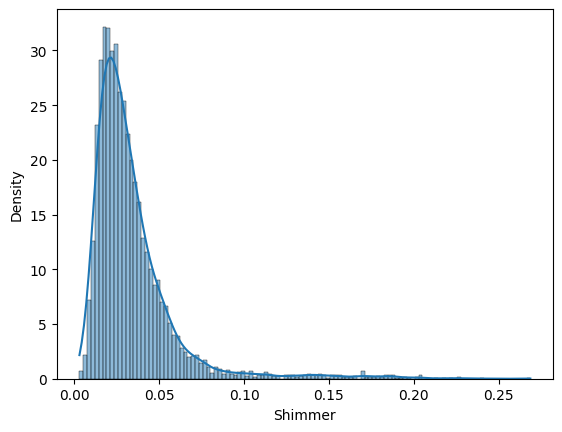

In [ ]:
sns.histplot(X.Shimmer, kde=True, stat='density')

In [ ]:
scipy.stats.normaltest(X.Shimmer)

NormaltestResult(statistic=4195.489404322647, pvalue=0.0)

as we can see here we know that this distribution is not normal and also we have right skewness

<Axes: xlabel='Jitter_percent', ylabel='Density'>

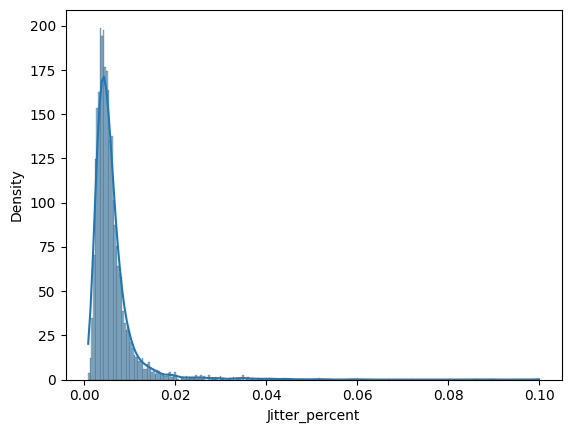

In [ ]:
sns.histplot(X.Jitter_percent, kde=True, stat='density')

In [ ]:
scipy.stats.normaltest(X.Jitter_percent)

NormaltestResult(statistic=7134.412683965, pvalue=0.0)

we can see here in `Jitter_percent` also we have `right skewness` and also this is not normal distribution because we have `p_value < 0.05` and null hypothesis rejected.

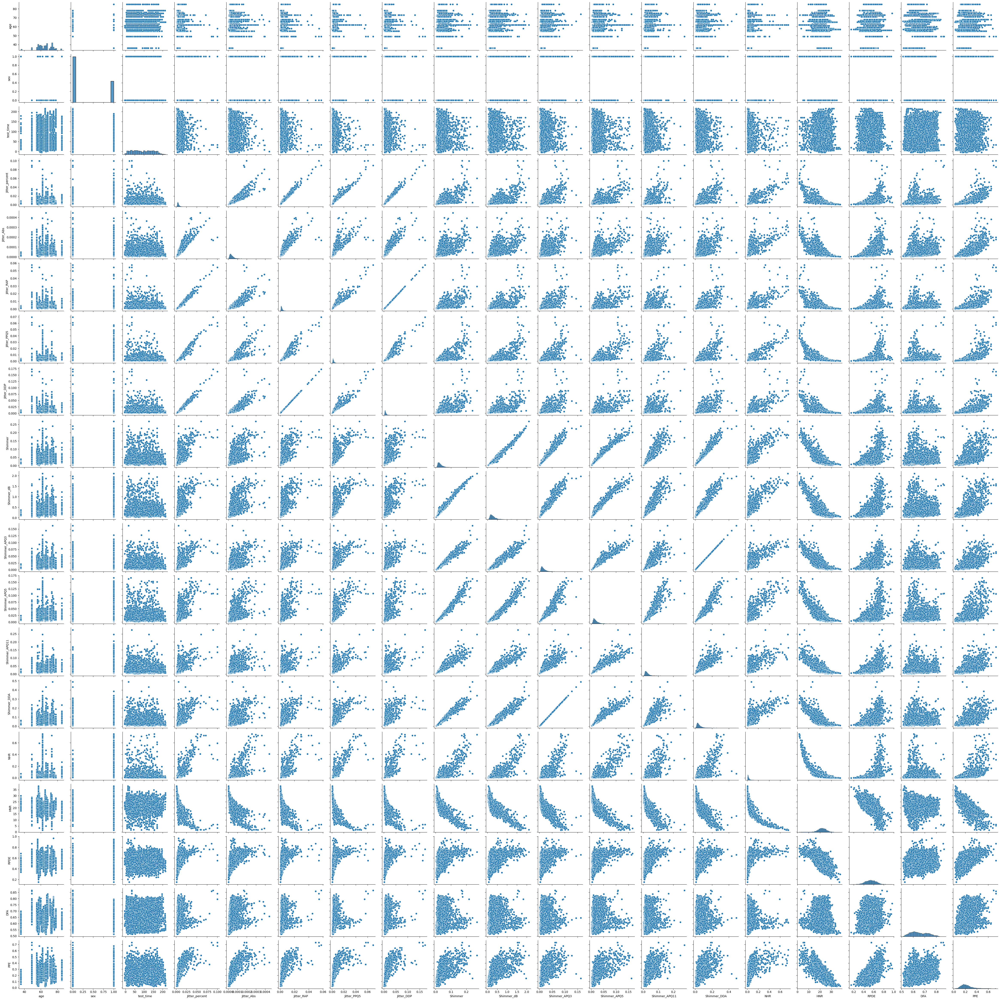

In [ ]:
sns.pairplot(X)

We can obviously see the `correlation between features` and `multicolinarity`, and also `skewness` in ditribution of features.  
we check it in next cells.

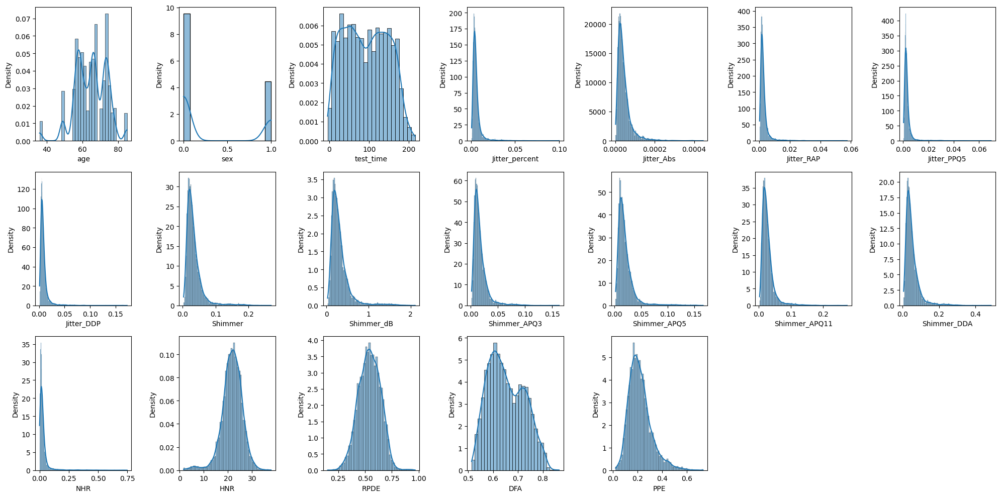

In [ ]:
fig = plt.figure(figsize=(20,10))
for i in range(0, len(X.columns)):
  ax = fig.add_subplot(3,7,i+1)
  sns.histplot(X.iloc[:, i], kde=True, stat='density', ax=ax)
plt.tight_layout()

Except `age`, `sex`(demographic), `test_time`(time of recruitment) that are features we do not consider them now, other features have skewness in their distribution one assumption of lienar regression is `normality` that we should get it by transformation.  

In [ ]:
X.skew()

age              -0.379133
sex               0.782873
test_time         0.077720
Jitter_percent    6.451846
Jitter_Abs        3.283006
Jitter_RAP        6.945438
Jitter_PPQ5       7.586205
Jitter_DDP        6.945376
Shimmer           3.312793
Shimmer_dB        3.099221
Shimmer_APQ3      3.097223
Shimmer_APQ5      3.698061
Shimmer_APQ11     3.406958
Shimmer_DDA       3.097224
NHR               6.549123
HNR              -0.812057
RPDE             -0.037434
DFA               0.282078
PPE               1.090819
dtype: float64

we see that our mentioned features most of them have `right skewness`, we will check it in creating linear regression model step.

# Unsupervised analysis

Here we try to use `deep learning` and `classic machine learning` unsupervised algorithms to understand better our dataset.

First we try `PCA` to decrease dimension then we use `autoencoder` and after that we `compare` these two after that we can use `clustering algorithms` and `visualizations` to better understand embedded data in latent space.

---

**Note:** By this work we hope to decrease `multicolinearity`

## Principal Component Analysis

In [ ]:
pca = PCA(19)
pca.fit(X)
pca.explained_variance_ratio_

array([9.67328894e-01, 2.64334838e-02, 6.15222039e-03, 7.35678708e-05,
       6.94232719e-06, 1.87934780e-06, 1.69968849e-06, 9.06963206e-07,
       3.40017469e-07, 3.52073470e-08, 1.53287374e-08, 1.09006532e-08,
       2.30141503e-09, 1.15203511e-09, 2.34353740e-10, 9.27169891e-11,
       5.58322645e-14, 2.26768655e-15, 2.20543363e-15])

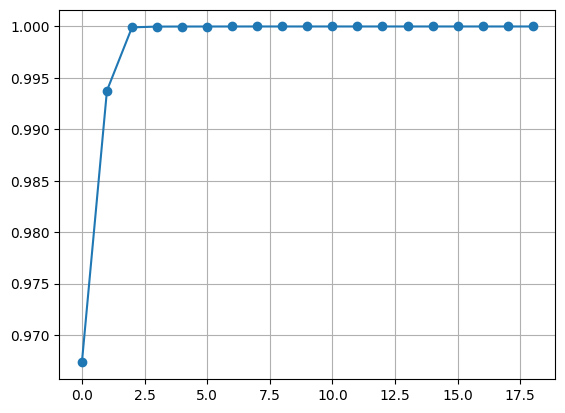

In [ ]:
plt.plot(np.cumsum(pca.explained_variance_ratio_), ls='-', marker='o')
plt.grid(True)

We can see with `2` components we can explaine more than `99` percent of variance of data.

Lets see multicolinearity

In [ ]:
pca = PCA(3)
pca_trans = pca.fit_transform(X)
pca_trans = pd.DataFrame(pca_trans, columns=['PCA1','PCA2', 'PCA3'])

In [ ]:
pca_trans.corr().style.background_gradient(cmap='coolwarm')

,PCA1,PCA2,PCA3
PCA1,1.000000,-0.000000,-0.000000
PCA2,-0.000000,1.000000,0.000000
PCA3,-0.000000,0.000000,1.000000


as we can see there are no internal correlation between principal components.  
Lets visualize it in two dimensions.

<Axes: xlabel='PCA1', ylabel='PCA2'>

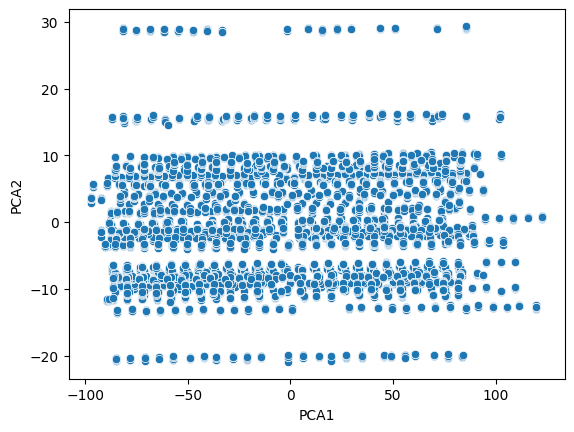

In [ ]:
sns.scatterplot(x=pca_trans.iloc[:,0], y=pca_trans.iloc[:,1])

Previousely we saw that most data are spread smoothly around zero therefore we did not do the scaling, now we want to do scaling and compare it with this analysis.

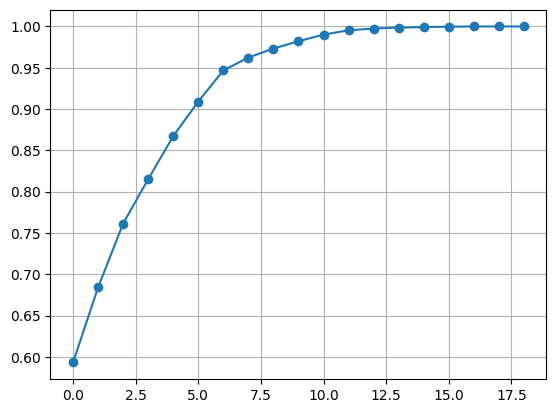

In [4]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X)
pca = PCA(19)
pca.fit(scaled_data)

plt.plot(np.cumsum(pca.explained_variance_ratio_), ls='-', marker='o')
plt.grid(True)

After `6` components we explained more than `95 percent` of variation of data this difference is because `three` features `age` and `sex` and `test_time` are not smoothly spread around zero like other features and have different scaling.

In [5]:
pca = PCA(7)
pca_trans = pca.fit_transform(scaled_data)
pca_trans = pd.DataFrame(pca_trans, columns=['PCA1','PCA2', 'PCA3', 'PCA4','PCA5', 'PCA6', 'PCA7'])

<Axes: xlabel='PCA1', ylabel='PCA2'>

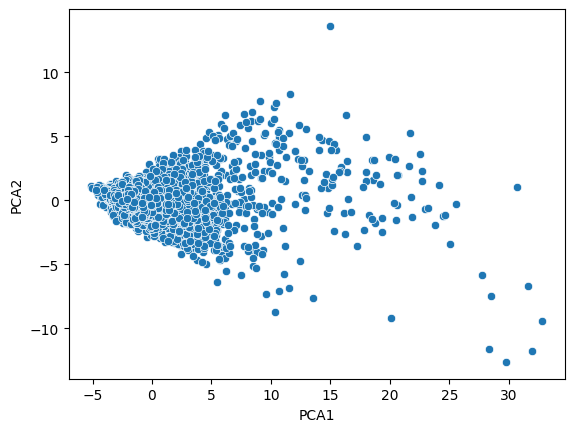

In [6]:
sns.scatterplot(x=pca_trans.iloc[:,0], y=pca_trans.iloc[:,1])

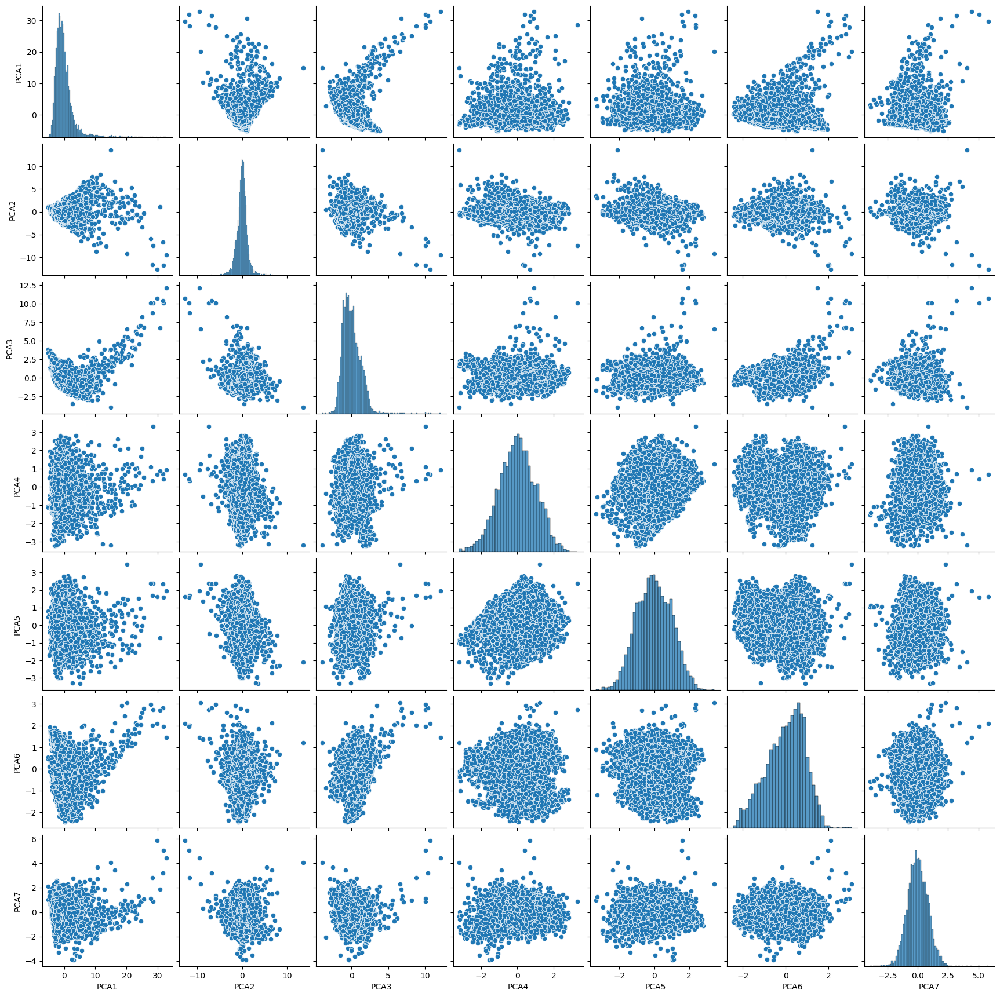

In [ ]:
sns.pairplot(pca_trans)

In [ ]:
pca_trans.corr().style.background_gradient(cmap='coolwarm')

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7
PCA1,1.000000,-0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000
PCA2,-0.000000,1.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000
PCA3,-0.000000,-0.000000,1.000000,-0.000000,-0.000000,-0.000000,0.000000
PCA4,0.000000,0.000000,-0.000000,1.000000,-0.000000,-0.000000,0.000000
PCA5,-0.000000,-0.000000,-0.000000,-0.000000,1.000000,-0.000000,0.000000
PCA6,0.000000,0.000000,-0.000000,-0.000000,-0.000000,1.000000,-0.000000
PCA7,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,1.000000


This principal component analysis is more correct than previouse one because of `scaling issue` and here like previous one we do not have `multicolinearity`.

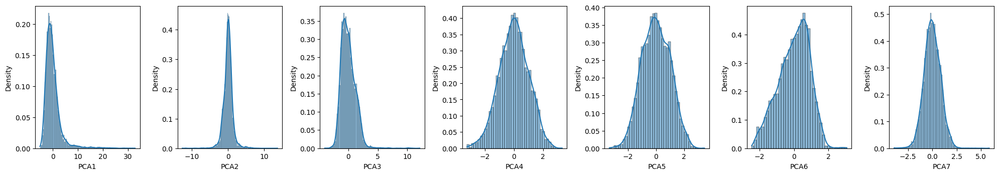

In [ ]:
fig = plt.figure(figsize=(20,10))
for i in range(0, len(pca_trans.columns)):
  ax = fig.add_subplot(3,7,i+1)
  sns.histplot(pca_trans.iloc[:, i], kde=True, stat='density', ax=ax)
plt.tight_layout()

In [ ]:
pca_trans.skew()

PCA1    3.612264
PCA2   -0.107762
PCA3    1.436520
PCA4   -0.103706
PCA5   -0.002868
PCA6   -0.334456
PCA7    0.103167
dtype: float64

Also here we can see distribution of our data is more closer to `normal distribiution` and we do not have `skewness` more than 0.5 or les than -0.5 except(`PCA1`)

## AutoEncoder

We have to create structure of our deep learning model first.

In [ ]:
def my_AE():
  # clear session
  tf.keras.backend.clear_session()
  #Encode part
  inp = tf.keras.layers.Input(shape=(19,))
  x = tf.keras.layers.Dense(units=15, activation='relu')(inp)
  x = tf.keras.layers.Dense(units=10, activation='relu')(x)
  x = tf.keras.layers.Dense(units=7, activation=None, name='LatentSpace_layer')(x)
  # create Encode model
  enc = tf.keras.Model(inp, x, name='Encoder')
  #Decoder part
  inp_2 = tf.keras.layers.Input(shape=(7,))
  x = tf.keras.layers.Dense(units=10, activation='relu')(inp_2)
  x = tf.keras.layers.Dense(units=15, activation='relu')(x)
  x = tf.keras.layers.Dense(units=19, activation=None, name='Reconstruction_Layer')(x)
  # create decoder model
  dec = tf.keras.Model(inp_2, x, name='Decoder')
  # combine both encoder and decoder
  enc_instance = enc(inp)
  dec_instance = dec(enc_instance)
  final_model = tf.keras.Model(inp, dec_instance, name='AutoEncoder')
  return final_model, enc, dec

ae, encoder, decoder = my_AE()
ae.summary()
encoder.summary()
decoder.summary()

Model: "AutoEncoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 19)]              0         
                                                                 
 Encoder (Functional)        (None, 7)                 537       
                                                                 
 Decoder (Functional)        (None, 19)                549       
                                                                 
Total params: 1086 (4.24 KB)
Trainable params: 1086 (4.24 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model: "Encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 19)]              0         
                                                                 
 dense

Lets compile and train our Autoencoder

In [ ]:
ae.compile(optimizer='rmsprop', loss='mse', metrics='mae')
history = ae.fit(scaled_data, scaled_data, batch_size=35, epochs=60, shuffle=True)

Epoch 1/60
168/168 [==============================] - 1s 1ms/step - loss: 0.7898 - mae: 0.5953
Epoch 2/60
168/168 [==============================] - 0s 1ms/step - loss: 0.3926 - mae: 0.4244
Epoch 3/60
168/168 [==============================] - 0s 1ms/step - loss: 0.2993 - mae: 0.3690
Epoch 4/60
168/168 [==============================] - 0s 1ms/step - loss: 0.2619 - mae: 0.3417
Epoch 5/60
168/168 [==============================] - 0s 1ms/step - loss: 0.2346 - mae: 0.3210
Epoch 6/60
168/168 [==============================] - 0s 1ms/step - loss: 0.2107 - mae: 0.3026
Epoch 7/60
168/168 [==============================] - 0s 1ms/step - loss: 0.1945 - mae: 0.2887
Epoch 8/60
168/168 [==============================] - 0s 1ms/step - loss: 0.1839 - mae: 0.2792
Epoch 9/60
168/168 [==============================] - 0s 1ms/step - loss: 0.1762 - mae: 0.2730
Epoch 10/60
168/168 [==============================] - 0s 1ms/step - loss: 0.1690 - mae: 0.2677
Epoch 11/60
168/168 [============================

In [ ]:
history.history.keys()

dict_keys(['loss', 'mae'])

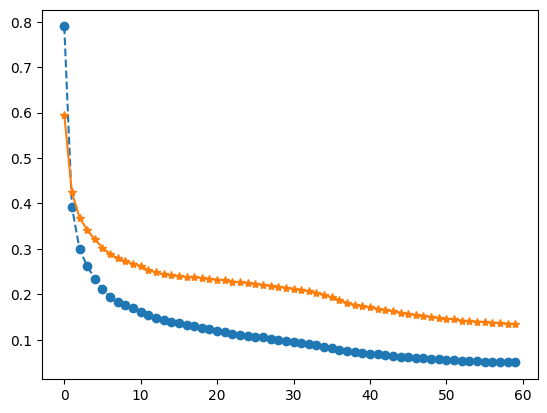

In [ ]:
plt.plot(history.history['loss'],ls='--',marker='o')
plt.plot(history.history['mae'],ls='-',marker='*')

Our model trained very good now lets embedd data to latent space with 7 dims.

In [ ]:
embedded_data = encoder.predict(scaled_data)

184/184 [==============================] - 0s 1ms/step


In [ ]:
embedded_data = pd.DataFrame(embedded_data, columns=['dim1','dim2', 'dim3', 'dim4','dim5', 'dim6', 'dim7'])

Lets visualize our embedded data

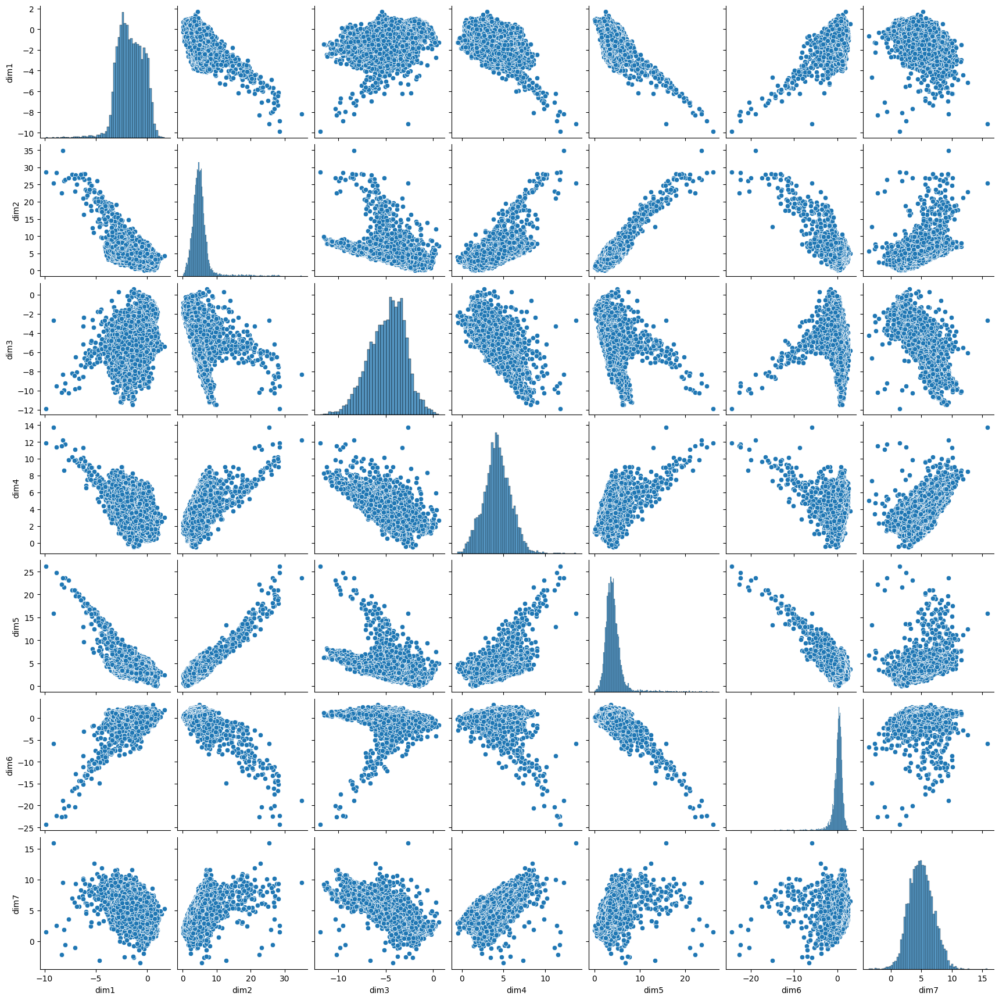

In [ ]:
sns.pairplot(embedded_data)

In [ ]:
embedded_data.corr().style.background_gradient(cmap='coolwarm')

,dim1,dim2,dim3,dim4,dim5,dim6,dim7
dim1,1.000000,-0.559208,0.300678,-0.481400,-0.566763,0.368246,-0.377104
dim2,-0.559208,1.000000,-0.378056,0.572165,0.868613,-0.693380,0.481758
dim3,0.300678,-0.378056,1.000000,-0.697321,-0.413087,-0.100007,-0.752865
dim4,-0.481400,0.572165,-0.697321,1.000000,0.493929,-0.122063,0.630220
dim5,-0.566763,0.868613,-0.413087,0.493929,1.000000,-0.711645,0.423708
dim6,0.368246,-0.693380,-0.100007,-0.122063,-0.711645,1.000000,0.140969
dim7,-0.377104,0.481758,-0.752865,0.630220,0.423708,0.140969,1.000000


Compare PCA and Autoencoder using `reconstruction` metric

In [ ]:
recons_ae = ae.predict(scaled_data)
recons_ae.shape

184/184 [==============================] - 0s 931us/step


(5875, 19)

In [ ]:
mean_squared_error(scaled_data, recons_ae) # how much are they look like original data

0.04901228916206343

In [ ]:
recons_pca = pca.inverse_transform(pca_trans)
mean_squared_error(scaled_data, recons_pca)

0.053241526905920954

We use PCA and Autoencoder to embedding our data to lower dims and here we have results:  

1. overally `deep learning` has potentioal to embedd data to dimensions lower than `PCA`.
2. we need to train `Autoencoder` and only after that we can use it to embedd data therefore we need more time to create right architecture of Model and also train model.
3. we need more data to train `deep learning model` very well rather than `PCA`.  
4. with reconstruction metric we found that `Autoencoder` did better rather than `PCA`.(0.053 > 0.049)
5. we have multicolinearity between 7 dims that created by `Autoencoder` but we do not have this situation in `PCA`

**Last Note:** i decided to use `PCA` because we have good `reconstruction metric score` and also more important we do not have `multicolinearity` between embedded data.

# Supervised Analysis

We are going to use two type of model for this analysis one of them is `traditional supervised learning model` for `regression analysis` with fine-tuning approaches and the second is `Deep learning model` with its fine-tuning approaches, we also use `grid search` during `fine-tuning` procedure to find better `hyperparameters` for both `traditional` and `Deep learning` models   

## Preprocessing
> Preprocess data for Predictive Analysis

In [7]:
pca_trans.head()

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7
0,-0.946460,0.222569,0.892027,-0.081982,2.099940,0.940348,0.966939
1,-2.570790,0.770084,0.570305,-0.178747,1.830048,0.927697,0.979551
2,-1.910521,0.110129,0.419661,0.141209,2.044041,0.817032,0.263287
3,-0.994982,0.036962,-0.126712,0.117617,1.792672,0.454526,0.312410
4,-2.449020,0.398615,0.157387,0.176698,1.696410,0.763127,0.383937


Check Mean and STD

In [8]:
pca_trans.mean(), pca_trans.std()

(PCA1    3.455959e-16
 PCA2    1.395527e-16
 PCA3   -2.125864e-16
 PCA4    7.388889e-18
 PCA5    1.551478e-16
 PCA6    1.754436e-16
 PCA7   -8.609661e-17
 dtype: float64,
 PCA1    3.357330
 PCA2    1.313671
 PCA3    1.213214
 PCA4    1.009532
 PCA5    0.995388
 PCA6    0.892316
 PCA7    0.846172
 dtype: float64)

Check Normality using Normal test Skewness and Visualization

In [9]:
for i in pca_trans.columns:
  stats, pval = scipy.stats.normaltest(pca_trans[i])
  print(f'P Value for column {i} is {pval}')

P Value for column PCA1 is 0.0
P Value for column PCA2 is 8.058902591693034e-235
P Value for column PCA3 is 0.0
P Value for column PCA4 is 0.00042482755360055886
P Value for column PCA5 is 1.493261330536756e-14
P Value for column PCA6 is 5.945881342025521e-36
P Value for column PCA7 is 2.8221981418077717e-30


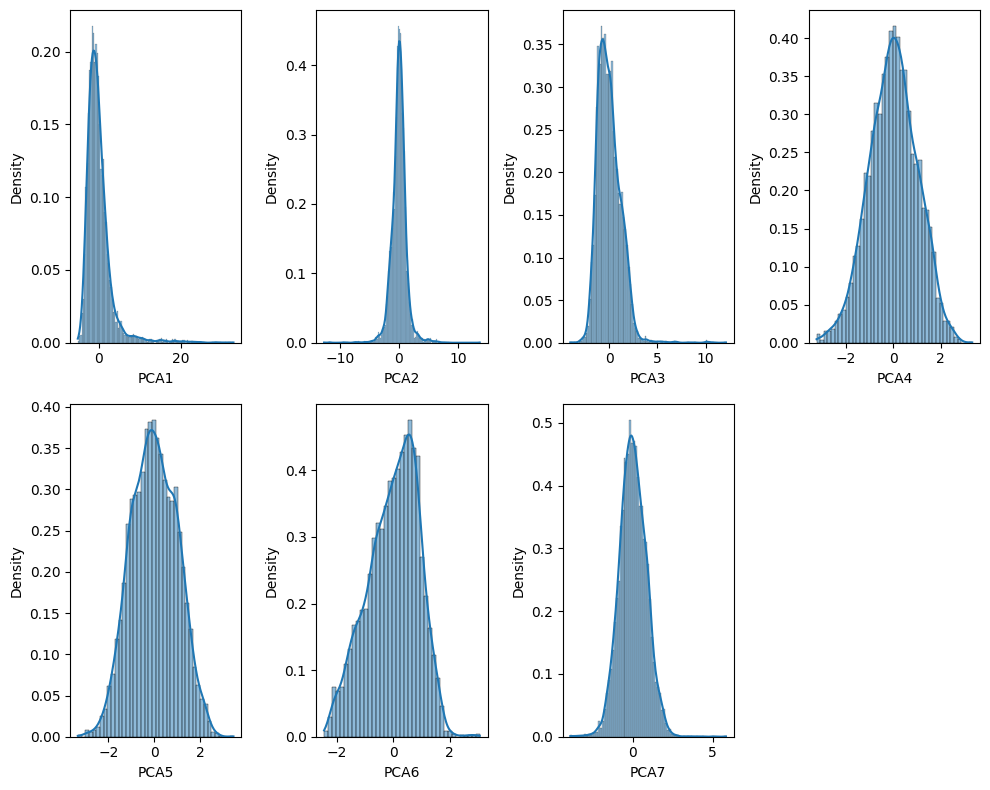

In [ ]:
fig = plt.figure(figsize=(10,8))
for index, i in enumerate(pca_trans):
  ax1 = fig.add_subplot(2,4,index+1)
  sns.histplot(pca_trans.loc[:,i], kde=True, stat='density', discrete=False, ax=ax1)

plt.tight_layout()
plt.show()

In [ ]:
pca_trans.skew()

PCA1    3.612264
PCA2   -0.107762
PCA3    1.436520
PCA4   -0.103706
PCA5   -0.002868
PCA6   -0.334456
PCA7    0.103167
dtype: float64

We checked `normality` of principal components by `normal test` (`P_value`) and `skewness` and `visualization` and here we are:  

> `PCA1` and `PCA3` have **right skewness** and also `P_value` more than **0.05** so these two components have a **little bit** difference from `normal distribution`.

> Other components are looks like `normal distribution`.

Check Multicolinearity

In [10]:
pca_trans.corr().round(3).style.background_gradient(cmap='coolwarm')

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7
PCA1,1.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000
PCA2,-0.000000,1.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000
PCA3,-0.000000,0.000000,1.000000,-0.000000,-0.000000,-0.000000,0.000000
PCA4,0.000000,0.000000,-0.000000,1.000000,-0.000000,-0.000000,0.000000
PCA5,0.000000,-0.000000,-0.000000,-0.000000,1.000000,-0.000000,0.000000
PCA6,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,1.000000,0.000000
PCA7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000


Is there `multicolinearity`?  
> **No**

In [ ]:
pca_trans.shape, y.shape

((5875, 7), (5875, 2))

Split our dataset

In [ ]:
y.columns

Index(['motor_UPDRS', 'total_UPDRS'], dtype='object')

We have `two` target variables and we know these two variable have `strong positive pearson correlation` with each other therefore we pick up `one variable` for our regression analysis.

In [9]:
X_train, X_test, y_train, y_test = train_test_split(pca_trans.to_numpy(), y['motor_UPDRS'].to_numpy(),
                                                    shuffle=True, test_size=0.3)

In [10]:
X_test.shape, y_test.shape, X_train.shape, y_train.shape

((1763, 7), (1763,), (4112, 7), (4112,))

## Traditional models

We use `Scikit-Learn` Package to implement `Traditional Regression models` for our problem and also we use `GridSearchCV module` to search through our arguments to find best values for our `hyperparameters`.

Polynomial Regression

In [ ]:
pipe = Pipeline(steps=[('poly', PolynomialFeatures()),('ml', LinearRegression())])
params = {'poly__degree':[2,3,4,5,6,7,8,9,10]}
grid = GridSearchCV(estimator=pipe, param_grid=params, scoring='neg_root_mean_squared_error', cv=4)
grid.fit(X_train, y_train)
grid.best_params_, grid.best_score_

({'poly__degree': 3}, -7.0739483051402345)

In [ ]:
grid.best_estimator_.score(X_train,y_train) #r2_score

0.47028663945281457

In [ ]:
pred = grid.best_estimator_.predict(X_test)
np.sqrt(mean_squared_error(y_pred=pred, y_true=y_test)) # root of mean squared error

6.520462993696968

Ridge Regression

In [ ]:
pl = PolynomialFeatures(degree=3)
pl_data_train = pl.fit_transform(X_train)
pl_data_test = pl.fit_transform(X_test)

In [ ]:
rdg = Ridge(max_iter=5000)
params = {'alpha':[0.1,0.01,2,3,1,5,10,15,20,25,30]}
grid = GridSearchCV(estimator=rdg, param_grid=params, scoring='neg_root_mean_squared_error', cv=4)
grid.fit(pl_data_train, y_train)
grid.best_params_, grid.best_score_

({'alpha': 0.01}, -7.074493082975743)

In [ ]:
grid.best_estimator_.score(pl_data_train,y_train) #r2_score

0.47028661232820634

In [ ]:
pred = grid.best_estimator_.predict(pl_data_test)
np.sqrt(mean_squared_error(y_pred=pred, y_true=y_test)) # root of mean squared error

6.520403790791366

Lasso Regression

In [ ]:
lass = Lasso(max_iter=5000)
params = {'alpha':[0.1,0.01,2,3,1,5,10,15,20,25,30]}
grid = GridSearchCV(estimator=lass, param_grid=params, scoring='neg_root_mean_squared_error', cv=4)
grid.fit(pl_data_train, y_train)
grid.best_params_, grid.best_score_

({'alpha': 0.1}, -6.636260940560575)

In [ ]:
grid.best_estimator_.score(pl_data_train,y_train) #r2_score

0.42843700272201135

In [ ]:
pred = grid.best_estimator_.predict(pl_data_test)
np.sqrt(mean_squared_error(y_pred=pred, y_true=y_test)) # root of mean squared error

6.375501451137969

Results of Traditional models:
> As we can see `traditional models` can not play a good work for this problem with this dataset because we have `complex` problem with `complex` relations between `dependent` as `independent variables`.  

## Deep Learning models

Here we try to create good `deep learning architecture` to capture relations between `dependent` and `indepentent` variables.

In [74]:
# create functional api model
def regression_model():
  #cleaning
  tf.keras.backend.clear_session()
  # regulizers
  l1 = tf.keras.regularizers.L1(l1=0.3)
  l2 = tf.keras.regularizers.L2(l2=0.5)
  #model layers
  inp_load = tf.keras.layers.Input(shape=(X_train.shape[1],))
  x1 = tf.keras.layers.Dense(units=50, activation='relu')(inp_load)
  x2 = tf.keras.layers.Dense(units=32, activation='relu')(x1)
  x3 = tf.keras.layers.Dropout(rate=0.25)(x2)
  x4 = tf.keras.layers.Dense(units=25, activation='relu')(x3)
  x5 = tf.keras.layers.Dropout(rate=0.25)(x4)
  x6 = tf.keras.layers.Dense(units=17, activation='sigmoid')(x5)
  x7 = tf.keras.layers.Dense(units=13, activation='tanh')(x6)
  x8 = tf.keras.layers.Dense(units=1, activation='exponential')(x7)
  # construct model class
  myml = tf.keras.Model(inp_load, x8)
  myml.summary()
  return myml

In [75]:
rmodel = regression_model()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 7)]               0         
                                                                 
 dense (Dense)               (None, 50)                400       
                                                                 
 dense_1 (Dense)             (None, 32)                1632      
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 25)                825       
                                                                 
 dropout_1 (Dropout)         (None, 25)                0         
                                                                 
 dense_3 (Dense)             (None, 17)                442   

In [76]:
opt = tf.keras.optimizers.Adam()
rmodel.compile(optimizer=opt, loss='mse')

In [77]:
hist = rmodel.fit(X_train, y_train, epochs=200, batch_size=60, validation_data=(X_test,y_test), shuffle=True)

Epoch 1/200
69/69 [==============================] - 3s 7ms/step - loss: 236.2580 - val_loss: 63.5635
Epoch 2/200
69/69 [==============================] - 0s 5ms/step - loss: 63.8466 - val_loss: 60.5150
Epoch 3/200
69/69 [==============================] - 0s 5ms/step - loss: 58.8811 - val_loss: 55.8609
Epoch 4/200
69/69 [==============================] - 0s 5ms/step - loss: 54.0576 - val_loss: 51.0364
Epoch 5/200
69/69 [==============================] - 0s 5ms/step - loss: 49.8349 - val_loss: 46.7430
Epoch 6/200
69/69 [==============================] - 0s 5ms/step - loss: 45.9264 - val_loss: 42.4944
Epoch 7/200
69/69 [==============================] - 0s 5ms/step - loss: 41.8375 - val_loss: 39.2887
Epoch 8/200
69/69 [==============================] - 0s 5ms/step - loss: 40.2000 - val_loss: 37.5973
Epoch 9/200
69/69 [==============================] - 0s 5ms/step - loss: 37.8862 - val_loss: 35.8890
Epoch 10/200
69/69 [==============================] - 0s 5ms/step - loss: 36.7648 - val_lo

We can see after `200` epochs we stuck in the `local minimum` but we have better `MSE` rather than traditional models, and ofcourse we can make our model better by changing the `architecture` and add more `flexible` and `complexity` into it.

---

**Note:** You have to be aware aboute `bias variance` tradeoff

In [78]:
pred = rmodel.predict(X_test)
np.sqrt(mean_squared_error(y_pred=pred, y_true=y_test))

56/56 [==============================] - 0s 2ms/step


3.8669769193527843

# Results  
> we can see `deep learning model` work very better than `traditional models` and we have `more flexible` on `deep learning models` than `traditional models` and we can have very more and complex combination of data in this problem therfore deep learning models are more suitable than traditional models.

#Next Steps
All data science projects need next steps and here we have a few steps that we can do it in future.  
1. correct the skewness of `PCA1` and `PCA3`.   
2. embedd data in `dimensions` more than 7.
3. create `handcrafted` features.
4. use deep learning to `create new features`.
5. more analysis on `features` (feature engineering) to capture more `importance features` and relations`.
6. create more `complex` architect with `fine-tune` hyperparameter for `deep learning model`.
7. use `ensemble models` for `traditional models`.